# Chapter 4: Discrete Cosine / Wavelet Transform and Deconvolution

## Problems

## 1. Template matching with Phase-Correlation in Frequency Domain

In [1]:
from IPython.core.display import display,HTML
display(HTML('<style>.prompt{width: 0px; min-width: 0px; visibility: collapse}</style>'))

In [9]:
%matplotlib inline
import scipy.fftpack as fp
from skimage.io import imread
from skimage.color import rgb2gray, gray2rgb
from skimage.draw import rectangle_perimeter
import numpy as np
import matplotlib.pylab as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import LinearLocator, FormatStrFormatter

In [10]:
def plot_3d(X, Y, Z, cmap=plt.cm.seismic):
    fig = plt.figure(figsize=(20,20))
    ax = fig.gca(projection='3d')
    # Plot the surface.
    surf = ax.plot_surface(X, Y, Z, cmap=cmap, linewidth=5, antialiased=False)
    #ax.plot_wireframe(X, Y, Z, rstride=10, cstride=10)
    #ax.set_zscale("log", nonposx='clip')
    #ax.zaxis.set_scale('log')
    ax.zaxis.set_major_locator(LinearLocator(10))
    ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    ax.set_xlabel('F1', size=30)
    ax.set_ylabel('F2', size=30)
    ax.set_zlabel('Freq Response', size=30)
    #ax.set_zlim((-40,10))
    # Add a color bar which maps values to colors.
    fig.colorbar(surf) #, shrink=0.15, aspect=10)
    #plt.title('Frequency Response of the Gaussian Kernel')
    plt.show()    

In [4]:
im = 255*rgb2gray(imread('images/Img_04_01.jpg'))
im_tm = 255*rgb2gray(imread('images/Img_04_02.png'))

In [5]:
F = fp.fftn(im)
F_tm = fp.fftn(im_tm, shape=im.shape)

In [6]:
F_cc = F * np.conj(F_tm)
c = (fp.ifftn(F_cc/np.abs(F_cc))).real
i, j = np.unravel_index(c.argmax(), c.shape)
print(i, j)

52 174


In [7]:
im2 = (gray2rgb(im)).astype(np.uint8)
rr, cc = rectangle_perimeter((i,j), end=(i + im_tm.shape[0], j + im_tm.shape[1]), shape=im.shape)
for x in range(-2,2):
    for y in range(-2,2):
        im2[rr + x, cc + y] = (255,0,0)

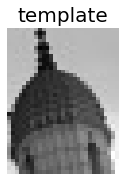

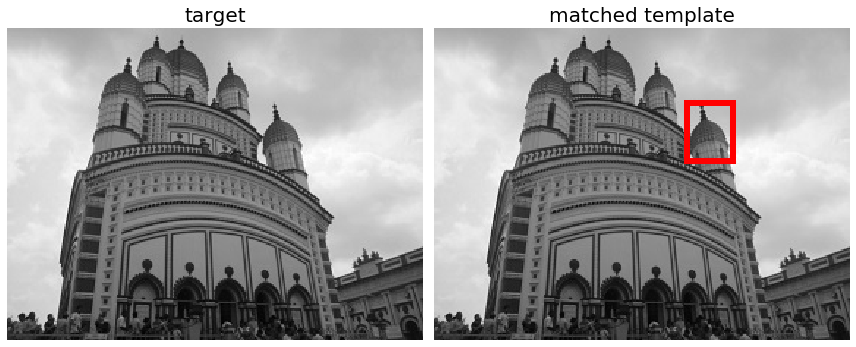

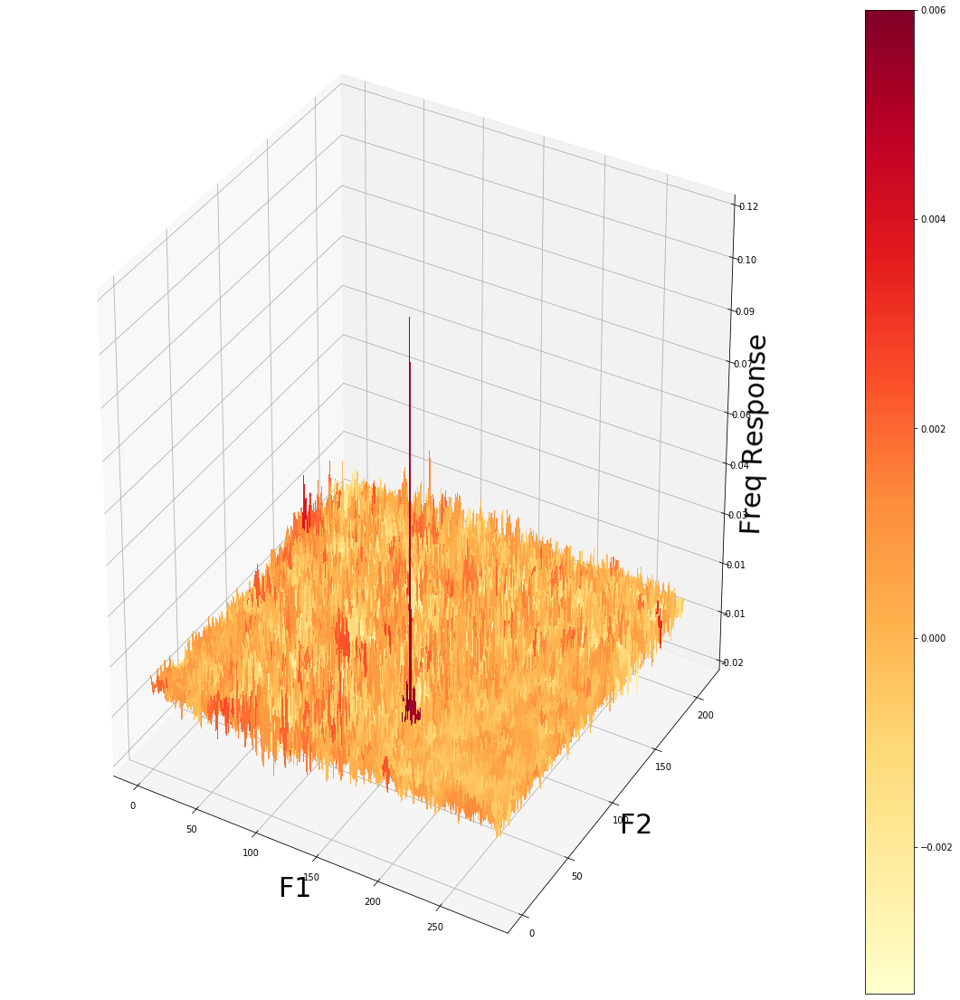

In [11]:
plt.figure(figsize=(2,3))
plt.gray()
plt.imshow(im_tm), plt.title('template', size=20), plt.axis('off')
plt.show()
fig, ax = plt.subplots(1, 2, sharey=True, figsize=(12,7))
ax[0].imshow(im), ax[0].set_title('target', size=20)
ax[1].imshow(im2), ax[1].set_title('matched template', size=20)
for a in ax.ravel():
    a.set_axis_off()
plt.tight_layout()
plt.show()
Y = np.arange(F_cc.shape[0])
X = np.arange(F_cc.shape[1])
X, Y = np.meshgrid(X, Y)
Z = c
plot_3d(X,Y,Z, cmap='YlOrRd') #PiYG

![](../images/tmatch.gif)

## 2. Image Compression with Discrete Cosine Transform (DCT)

In [14]:
from scipy.fftpack import dct, idct

In [13]:
# implement 2D DCT
def dct2(a):
    return dct(dct(a, axis=0, norm='ortho'), axis=1, norm='ortho')

# implement 2D IDCT
def idct2(a):
    return idct(idct(a, axis=0, norm='ortho'), axis=1, norm='ortho')    

In [16]:
im = rgb2gray(imread('images/Img_04_04.jpg')) 
imF = dct2(im)
im1 = idct2(imF)

In [17]:
print(np.allclose(im, im1))
# True

True


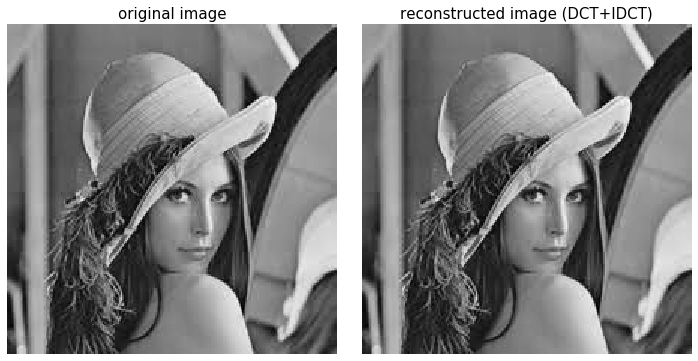

In [18]:
plt.figure(figsize=(10,5))
plt.gray()
plt.subplot(121), plt.imshow(im), plt.axis('off'), plt.title('original image', size=15)
plt.subplot(122), plt.imshow(im1), plt.axis('off'), plt.title('reconstructed image (DCT+IDCT)', size=15)
plt.tight_layout()
plt.show()

### JPEG Compression

In [20]:
im = rgb2gray(imread('images/Img_04_05.png'))

dct_coeffs = np.zeros(im.shape)
# Do 8x8 DCT on image (in-place)
for i in range(0, im.shape[0], 8):
    for j in range(0, im.shape[1], 8):
        dct_coeffs[i:(i+8),j:(j+8)] = dct2(im[i:(i+8),j:(j+8)])

C:\Users\Sandipan.Dey\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  """Entry point for launching an IPython kernel.


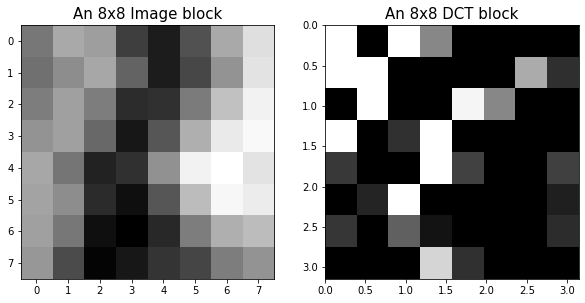

In [21]:
index = 112
plt.figure(figsize=(10,6))
plt.gray()
plt.subplot(121), plt.imshow(im[index:index+8,index:index+8]), plt.title( "An 8x8 Image block", size=15)
plt.subplot(122), plt.imshow(dct_coeffs[index:index+8,index:index+8], vmax= np.max(dct_coeffs)*0.01, vmin = 0, extent=[0, np.pi, np.pi, 0])
plt.title("An 8x8 DCT block", size=15)
plt.show()

In [22]:
thresh = 0.03
dct_thresh = dct_coeffs * (abs(dct_coeffs) > (thresh*np.max(dct_coeffs)))
percent_nonzeros = np.sum( dct_thresh != 0.0 ) / (im.shape[0]*im.shape[1])
print ("Keeping only {}% of the DCT coefficients".format(percent_nonzeros*100.0))

Keeping only 5.901336669921875% of the DCT coefficients


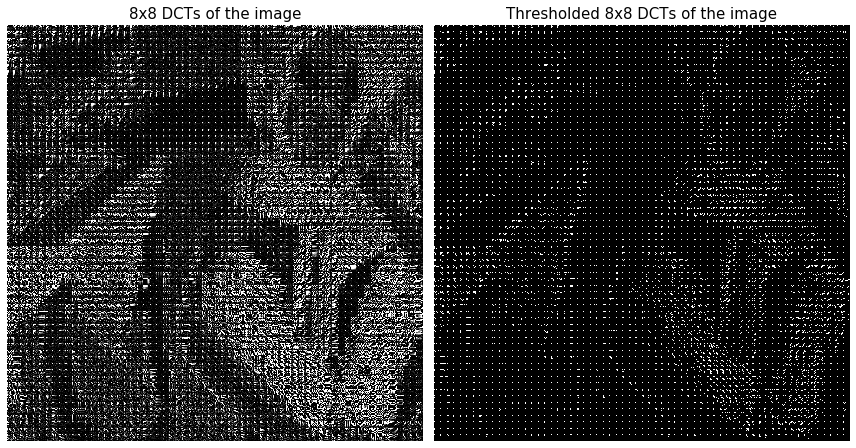

In [23]:
# Display entire DCT
plt.figure(figsize=(12,7))
plt.gray()
plt.subplot(121), plt.imshow(dct_coeffs,cmap='gray',vmax = np.max(dct_coeffs)*0.01,vmin = 0), plt.axis('off')
plt.title("8x8 DCTs of the image", size=15)
plt.subplot(122), plt.imshow(dct_thresh, vmax = np.max(dct_coeffs)*0.01, vmin = 0), plt.axis('off')
plt.title("Thresholded 8x8 DCTs of the image", size=15)
plt.tight_layout()
plt.show()

In [24]:
im_out = np.zeros(im.shape)
for i in range(0, im.shape[0], 8):
    for j in range(0, im.shape[1], 8):
        im_out[i:(i+8),j:(j+8)] = idct2( dct_thresh[i:(i+8),j:(j+8)] )

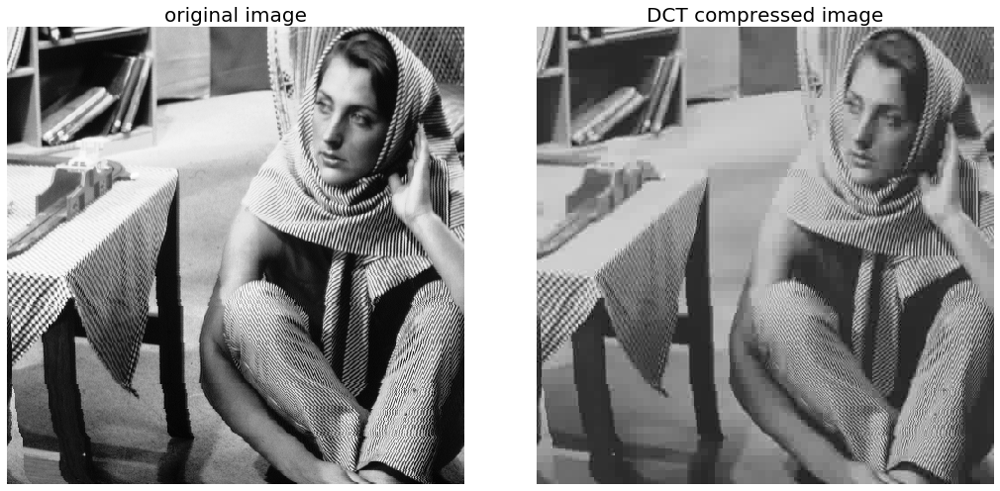

In [25]:
plt.figure(figsize=(15,7))
plt.gray()
plt.subplot(121), plt.imshow(im), plt.axis('off'), plt.title('original image', size=20)
plt.subplot(122), plt.imshow(im_out), plt.axis('off'), plt.title('DCT compressed image', size=20)
plt.tight_layout()
plt.show()

![](../images/jpeg.gif)

## 3. Image Denoising with Discrete Cosine Transform (DCT)

In [30]:
from skimage import img_as_float
from skimage.restoration import estimate_sigma
import cv2

In [27]:
im = img_as_float(imread('images/Img_04_06.jpg'))
sigma = 0.25
noisy = im + sigma * np.random.standard_normal(im.shape)
noisy = np.clip(noisy, 0, 1)

In [28]:
sigma_est = np.mean(estimate_sigma(noisy, multichannel=True))
print("estimated noise standard deviation = {}".format(sigma_est))

estimated noise standard deviation = 0.2159262644729317


In [31]:
out = noisy.copy()
cv2.xphoto.dctDenoising(noisy, out, sigma_est)
out = np.clip(out, 0, 1)

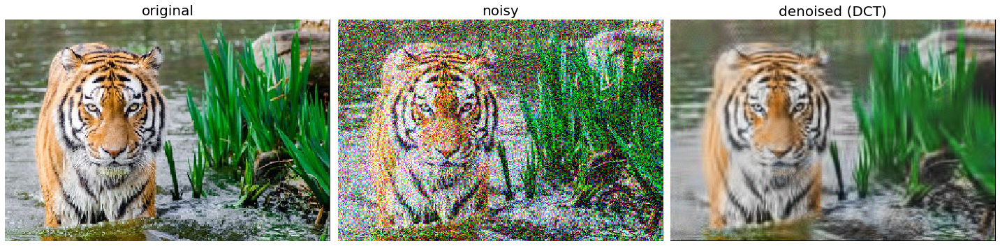

In [32]:
plt.figure(figsize=(20,10))
plt.subplot(131), plt.imshow(im), plt.axis('off'), plt.title('original', size=20)
plt.subplot(132), plt.imshow(noisy), plt.axis('off'), plt.title('noisy', size=20)
plt.subplot(133), plt.imshow(out), plt.axis('off'), plt.title('denoised (DCT)', size=20)
plt.tight_layout()
plt.show()

## 4. Deconvolution for Image Deblurring

In [33]:
import SimpleITK as sitk
from skimage import restoration
from skimage.metrics import peak_signal_noise_ratio

### 4.1 Blur Detection

In [34]:
from scipy.signal import convolve2d

def convolve(im, kernel):
    im1 = convolve2d(im, kernel, mode='same')
    return im1 / np.max(im1)

In [35]:
def check_if_blurry(image, threshold):
    # compute the Laplacian of the image and then return the focus
    # measure, which is simply the variance of the Laplacian
    var = cv2.Laplacian(image, cv2.CV_64F).var()
    return 'Var Laplacian = {}\n{}'.format(round(var, 6), 'Blurry' if var < threshold else 'Not Blurry')

def plot_blurry(im, title):
    plt.imshow(im), plt.axis('off'), plt.title(title, size=20)

In [38]:
def get_gaussian_edge_blur_kernel(sigma, sz=15):
    # First create a 1-D Gaussian kernel
    x = np.linspace(-10, 10, sz)
    kernel_1d = np.exp(-x**2/sigma**2)
    kernel_1d /= np.trapz(kernel_1d) # normalize the sum to 1.0
    # create a 2-D Gaussian kernel from the 1-D kernel
    kernel_2d = kernel_1d[:, np.newaxis] * kernel_1d[np.newaxis, :]
    return kernel_2d

In [39]:
threshold = 0.01
imlist = []

im = rgb2gray(imread('images/Img_04_06.jpg'))
imlist.append((im, 'original image\n' + check_if_blurry(im, threshold)))

kernel = get_gaussian_edge_blur_kernel(3)
im1 = convolve(im, kernel)
imlist.append((im1, '(edge) blurred image\n' + check_if_blurry(im1, threshold)))

In [41]:
def get_motion_blur_kernel(ln, angle, sz=15):
    kern = np.ones((1, ln), np.float32)
    angle = -np.pi*angle/180
    c, s = np.cos(angle), np.sin(angle)
    A = np.float32([[c, -s, 0], [s, c, 0]])
    sz2 = sz // 2
    A[:,2] = (sz2, sz2) - np.dot(A[:,:2], ((ln-1)*0.5, 0))
    kern = cv2.warpAffine(kern, A, (sz, sz), flags=cv2.INTER_CUBIC)
    return kern

In [42]:
kernel = get_motion_blur_kernel(9, 45)
im1 = convolve(im, kernel)
imlist.append((im1, '(motion) blurred image\n' + check_if_blurry(im1, threshold)))

In [43]:
def get_out_of_focus_kernel(r, sz=15):
    kern = np.zeros((sz, sz), np.uint8)
    cv2.circle(kern, (sz, sz), r, 255, -1, cv2.LINE_AA, shift=1)
    kern = np.float32(kern) / 255
    return kern

In [44]:
kernel = get_out_of_focus_kernel(7)
im1 = convolve(im, kernel)
imlist.append((im1, '(out-of-focus) blurred image\n' + check_if_blurry(im1, threshold)))

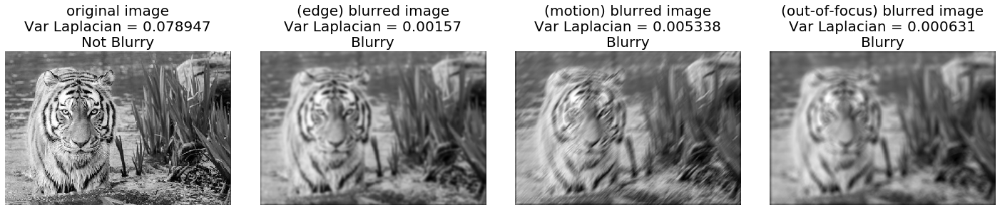

In [45]:
plt.figure(figsize=(20,7))
plt.gray()
for i in range(len(imlist)):
    im, title = imlist[i]
    plt.subplot(1,4,i+1), plot_blurry(im, title)
plt.tight_layout()
plt.show()

### 4.2 Non-blind Deblurring with SimpleITK deconvolution filters

In [48]:
import SimpleITK as sitk
from scipy import signal
im = rgb2gray(imread('images/img_04_07.png'))
psf = get_out_of_focus_kernel(7, 9).astype(np.float) 
im_blur = signal.convolve2d(im, psf, 'same')
im_blur = im_blur / np.max(im_blur)

C:\Users\Sandipan.Dey\anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Non RGB image conversion is now deprecated. For RGBA images, please use rgb2gray(rgba2rgb(rgb)) instead. In version 0.19, a ValueError will be raised if input image last dimension length is not 3.
  This is separate from the ipykernel package so we can avoid doing imports until


In [49]:
tkfilter = sitk.InverseDeconvolutionImageFilter()
tkfilter.SetNormalize(True)
im_res_IN = sitk.GetArrayFromImage(tkfilter.Execute (sitk.GetImageFromArray(im_blur), sitk.GetImageFromArray(psf)))

In [50]:
tkfilter = sitk.WienerDeconvolutionImageFilter()
tkfilter.SetNoiseVariance(0)
tkfilter.SetNormalize(True)
im_res_WN = sitk.GetArrayFromImage(tkfilter.Execute (sitk.GetImageFromArray(im_blur), sitk.GetImageFromArray(psf)))

In [51]:
tkfilter = sitk.TikhonovDeconvolutionImageFilter() 
tkfilter.SetRegularizationConstant(0.008) #0.06)
tkfilter.SetNormalize(True)
im_res_TK = sitk.GetArrayFromImage(tkfilter.Execute (sitk.GetImageFromArray(im_blur), sitk.GetImageFromArray(psf)))

In [52]:
tkfilter = sitk.RichardsonLucyDeconvolutionImageFilter() 
tkfilter.SetNumberOfIterations(100)
tkfilter.SetNormalize(True)
im_res_RL = sitk.GetArrayFromImage(tkfilter.Execute (sitk.GetImageFromArray(im_blur), sitk.GetImageFromArray(psf)))

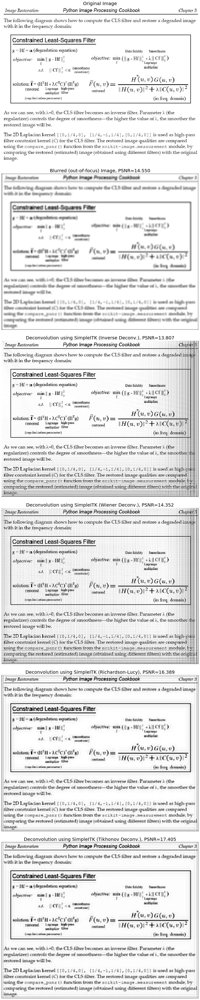

In [53]:
plt.figure(figsize=(20, 60))
plt.subplots_adjust(0,0,1,1,0.07,0.07)
plt.gray()

plt.subplot(611), plt.imshow(im), plt.axis('off'), plt.title('Original Image', size=20)
plt.subplot(612), plt.imshow(im_blur), plt.axis('off'), plt.title('Blurred (out-of-focus) Image, PSNR={:.3f}'.format(peak_signal_noise_ratio(im, im_blur)), size=20)
plt.subplot(613), plt.imshow(im_res_IN, vmin=im_blur.min(), vmax=im_blur.max()), plt.axis('off') 
plt.title('Deconvolution using SimpleITK (Inverse Deconv.), PSNR={:.3f}'.format(peak_signal_noise_ratio(im, im_res_IN)), size=20)
plt.subplot(614), plt.imshow(im_res_WN, vmin=im_blur.min(), vmax=im_blur.max()), plt.axis('off') 
plt.title('Deconvolution using SimpleITK (Wiener Deconv.), PSNR={:.3f}'.format(peak_signal_noise_ratio(im, im_res_WN)), size=20)
plt.subplot(615), plt.imshow(im_res_RL, vmin=im_blur.min(), vmax=im_blur.max()), plt.axis('off')
plt.title('Deconvolution using SimpleITK (Richardson-Lucy), PSNR={:.3f}'.format(peak_signal_noise_ratio(im, im_res_RL)), size=20)
plt.subplot(616), plt.imshow(im_res_TK, vmin=im_blur.min(), vmax=im_blur.max()), plt.axis('off')
plt.title('Deconvolution using SimpleITK (Tikhonov Deconv.), PSNR={:.3f}'.format(peak_signal_noise_ratio(im, im_res_TK)), size=20)

plt.show()

### 4.3 Non-blind Deblurring with scikit-image restoration module functions

In [54]:
from skimage import restoration

im_res_RL = restoration.richardson_lucy(im_blur, psf, iterations=20)

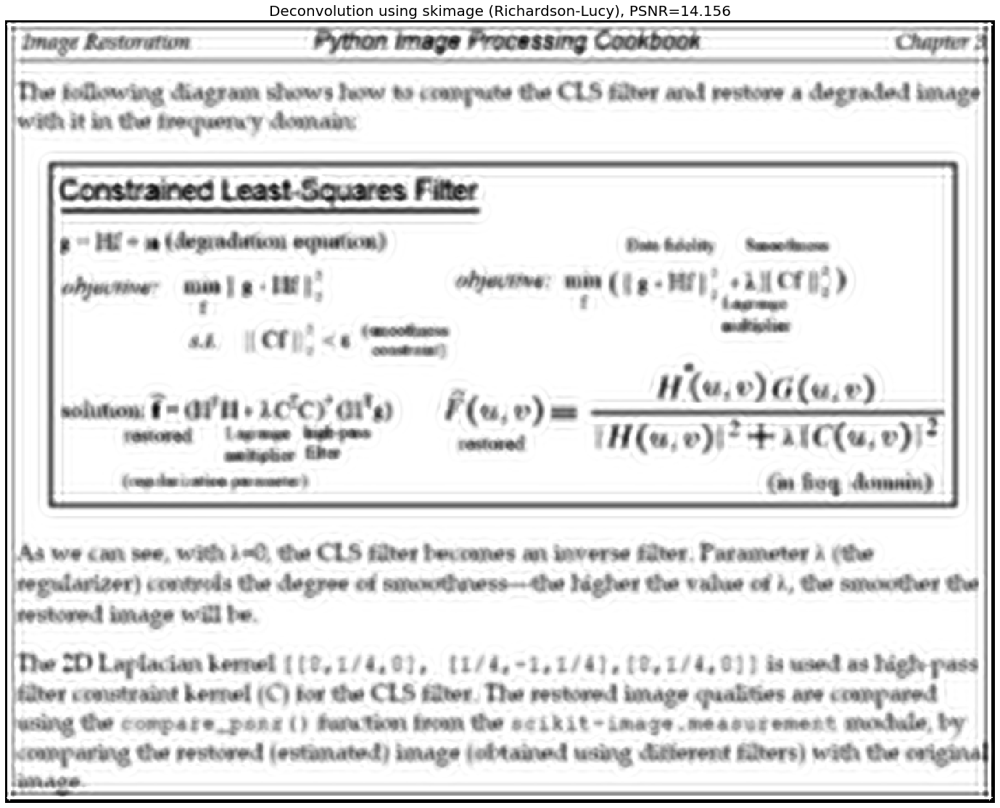

In [55]:
plt.figure(figsize=(20, 15))
plt.subplots_adjust(0,0,1,1,0.07,0.07)
plt.gray()
plt.imshow(im_res_RL, vmin=im_blur.min(), vmax=im_blur.max()), plt.axis('off')
plt.title('Deconvolution using skimage (Richardson-Lucy), PSNR={:.3f}'.format(peak_signal_noise_ratio(im, im_res_RL)), size=20)
plt.show()

## 5. Image Denoising with Wavelets

In [56]:
import numpy as np
import pywt
from pywt._doc_utils import wavedec2_keys, draw_2d_wp_basis
from skimage.filters import threshold_otsu
from skimage import img_as_float
import matplotlib.pylab as plt

### 5.0 Wavelet Basics 

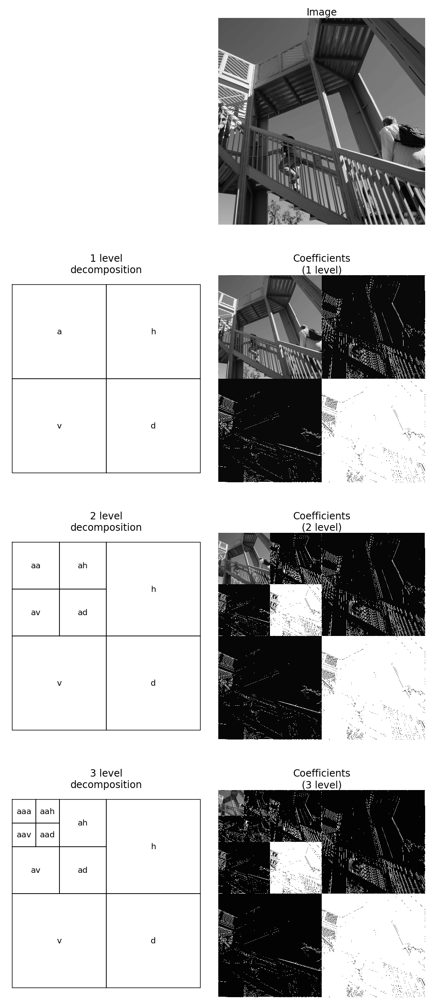

In [57]:
x = pywt.data.ascent().astype(np.float32)
shape = x.shape

plt.rcParams.update({'font.size': 20})

max_lev = 3       # how many levels of decomposition to draw
label_levels = 3  # how many levels to explicitly label on the plots

fig, axes = plt.subplots(4, 2, figsize=[15, 35])
plt.subplots_adjust(0, 0, 1, 0.95, 0.05, 0.05)
for level in range(0, max_lev + 1):
    if level == 0:
        # show the original image before decomposition
        axes[0, 0].set_axis_off()
        axes[0, 1].imshow(x, cmap=plt.cm.gray)
        axes[0, 1].set_title('Image')
        axes[0, 1].set_axis_off()
        continue

    # plot subband boundaries of a standard DWT basis
    draw_2d_wp_basis(shape, wavedec2_keys(level), ax=axes[level, 0],
                     label_levels=label_levels)
    axes[level, 0].set_title('{} level\ndecomposition'.format(level))

    # compute the 2D DWT
    c = pywt.wavedec2(x, 'db2', mode='periodization', level=level)
    # normalize each coefficient array independently for better visibility
    c[0] /= np.abs(c[0]).max()
    for detail_level in range(level):
        c[detail_level + 1] = [d/np.abs(d).max() > threshold_otsu(d/np.abs(d).max()) for d in c[detail_level + 1]]
    # show the normalized coefficients
    arr, slices = pywt.coeffs_to_array(c)
    axes[level, 1].imshow(arr, cmap=plt.cm.gray)
    axes[level, 1].set_title('Coefficients\n({} level)'.format(level))
    axes[level, 1].set_axis_off()

plt.tight_layout()
plt.show()

### 5.1 Image Denoising using Wavelets with pywt

In [106]:
image = img_as_float(imread('images/Img_04_04.jpg')) 
noise_sigma = 0.25 #16.0
image += np.random.normal(0, noise_sigma, size=image.shape)

In [107]:
wavelet = pywt.Wavelet('haar')
levels  = int(np.floor(np.log2(image.shape[0])))
print(levels)
wavelet_coeffs = pywt.wavedec2(image, wavelet, level=levels)

7


In [135]:
def denoise(image, wavelet, noise_sigma):
    levels = int(np.floor(np.log2(image.shape[0])))
    wc = pywt.wavedec2(image, wavelet, level=levels)
    arr, coeff_slices = pywt.coeffs_to_array(wc)
    arr = pywt.threshold(arr, noise_sigma, mode='soft')
    nwc = pywt.array_to_coeffs(arr, coeff_slices, output_format='wavedec2')
    return pywt.waverec2(nwc, wavelet)

In [136]:
print(pywt.wavelist(kind='discrete'))
wlts = ['bior1.5', 'coif5', 'db6', 'dmey', 'haar', 'rbio2.8', 'sym15'] # pywt.wavelist(kind='discrete')
Denoised={}
for wlt in wlts:
    out = image.copy()
    for i in range(3):
        out[...,i] = denoise(image[...,i], wavelet=wlt, noise_sigma=3/2*noise_sigma)
    Denoised[wlt] = np.clip(out, 0, 1)
print(len(Denoised))

['bior1.1', 'bior1.3', 'bior1.5', 'bior2.2', 'bior2.4', 'bior2.6', 'bior2.8', 'bior3.1', 'bior3.3', 'bior3.5', 'bior3.7', 'bior3.9', 'bior4.4', 'bior5.5', 'bior6.8', 'coif1', 'coif2', 'coif3', 'coif4', 'coif5', 'coif6', 'coif7', 'coif8', 'coif9', 'coif10', 'coif11', 'coif12', 'coif13', 'coif14', 'coif15', 'coif16', 'coif17', 'db1', 'db2', 'db3', 'db4', 'db5', 'db6', 'db7', 'db8', 'db9', 'db10', 'db11', 'db12', 'db13', 'db14', 'db15', 'db16', 'db17', 'db18', 'db19', 'db20', 'db21', 'db22', 'db23', 'db24', 'db25', 'db26', 'db27', 'db28', 'db29', 'db30', 'db31', 'db32', 'db33', 'db34', 'db35', 'db36', 'db37', 'db38', 'dmey', 'haar', 'rbio1.1', 'rbio1.3', 'rbio1.5', 'rbio2.2', 'rbio2.4', 'rbio2.6', 'rbio2.8', 'rbio3.1', 'rbio3.3', 'rbio3.5', 'rbio3.7', 'rbio3.9', 'rbio4.4', 'rbio5.5', 'rbio6.8', 'sym2', 'sym3', 'sym4', 'sym5', 'sym6', 'sym7', 'sym8', 'sym9', 'sym10', 'sym11', 'sym12', 'sym13', 'sym14', 'sym15', 'sym16', 'sym17', 'sym18', 'sym19', 'sym20']
7


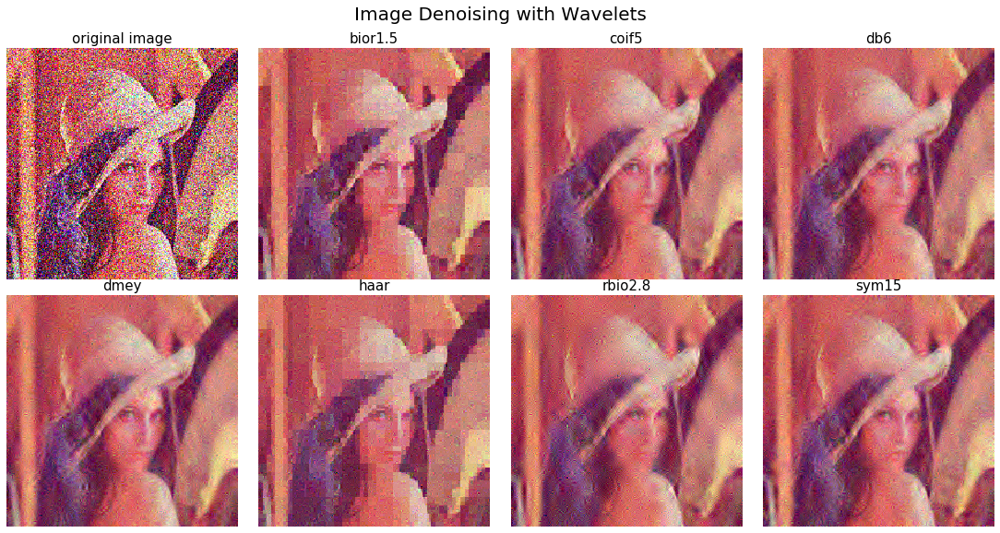

In [137]:
plt.figure(figsize=(15,8))
plt.subplots_adjust(0,0,1,0.9,0.05,0.07)
plt.subplot(241), plt.imshow(np.clip(image,0,1)), plt.axis('off'), plt.title('original image', size=15)
i = 2
for wlt in Denoised:
    plt.subplot(2,4,i), plt.imshow(Denoised[wlt]), plt.axis('off'), plt.title(wlt, size=15)
    i += 1
plt.suptitle('Image Denoising with Wavelets', size=20)
plt.show()

### 5.2 Image Denoising with Wavelets using scikit-image restoration

In [79]:
from skimage.restoration import (denoise_wavelet, estimate_sigma)
from skimage import data, img_as_float
from skimage.util import random_noise
from skimage.metrics import peak_signal_noise_ratio

In [80]:
original = img_as_float(imread('images/Img_04_08.png'))[...,:3]
sigma = 0.12
noisy = random_noise(original, var=sigma**2)

In [81]:
sigma_est = estimate_sigma(noisy, multichannel=True, average_sigmas=True)
print(f"Estimated Gaussian noise standard deviation = {sigma_est}")

Estimated Gaussian noise standard deviation = 0.11793211909757395


In [82]:
im_bayes = denoise_wavelet(noisy, multichannel=True, convert2ycbcr=True,
                           method='BayesShrink', mode='soft',
                           rescale_sigma=True)
im_visushrink = denoise_wavelet(noisy, multichannel=True, convert2ycbcr=True,
                                method='VisuShrink', mode='soft',
                                sigma=sigma_est, rescale_sigma=True)

In [83]:
im_visushrink2 = denoise_wavelet(noisy, multichannel=True, convert2ycbcr=True,
                                 method='VisuShrink', mode='soft',
                                 sigma=sigma_est/2, rescale_sigma=True)
im_visushrink4 = denoise_wavelet(noisy, multichannel=True, convert2ycbcr=True,
                                 method='VisuShrink', mode='soft',
                                 sigma=sigma_est/4, rescale_sigma=True)

In [84]:
psnr_noisy = peak_signal_noise_ratio(original, noisy)
psnr_bayes = peak_signal_noise_ratio(original, im_bayes)
psnr_visushrink = peak_signal_noise_ratio(original, im_visushrink)
psnr_visushrink2 = peak_signal_noise_ratio(original, im_visushrink2)
psnr_visushrink4 = peak_signal_noise_ratio(original, im_visushrink4)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


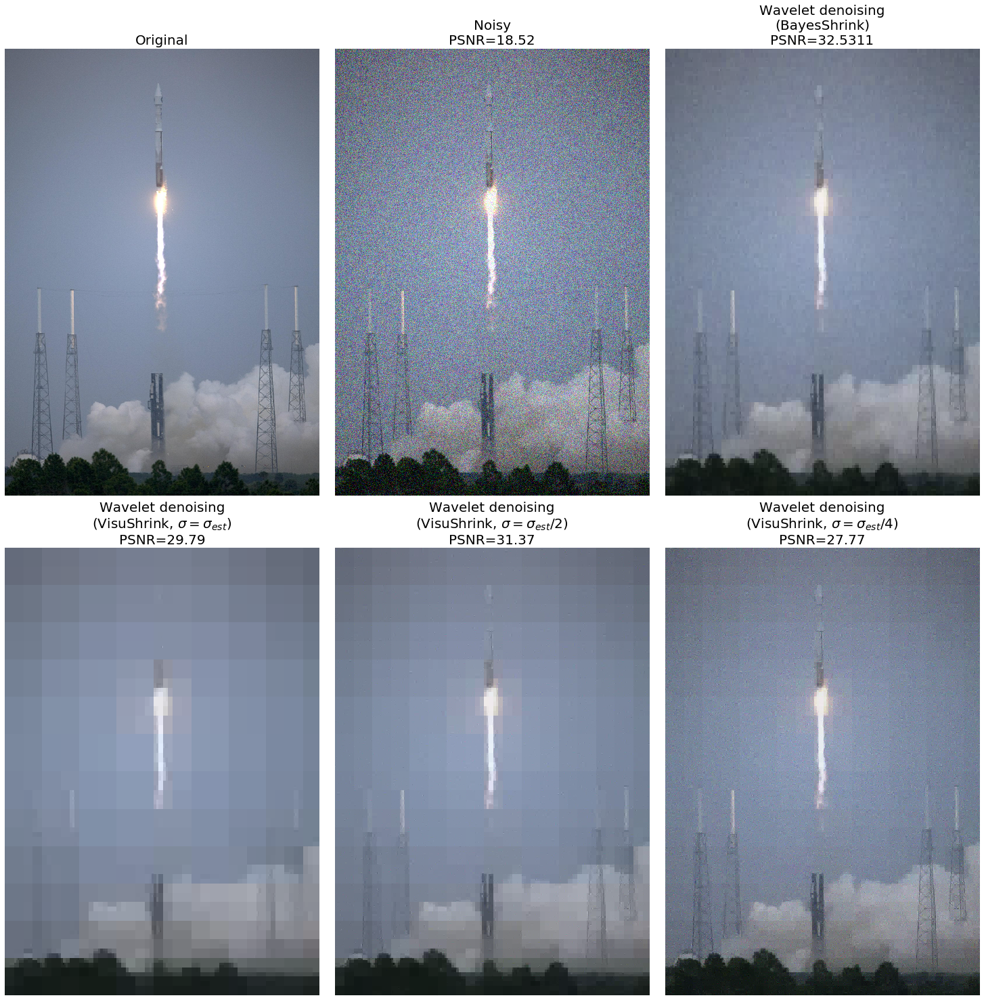

In [85]:
plt.figure(figsize=(20,20))
plt.subplots_adjust(0,0,1,1,0.05,0.05)
plt.subplot(231), plt.imshow(original), plt.axis('off'), plt.title('Original', size=20)
plt.subplot(232), plt.imshow(noisy), plt.axis('off'), plt.title('Noisy\nPSNR={:0.4g}'.format(psnr_noisy), size=20)
plt.subplot(233), plt.imshow(im_bayes/im_bayes.max()), plt.axis('off'), plt.title('Wavelet denoising\n(BayesShrink)\nPSNR={:0.4f}'.format(psnr_bayes), size=20)
plt.subplot(234), plt.imshow(im_visushrink/im_visushrink.max()), plt.axis('off')
plt.title('Wavelet denoising\n' + r'(VisuShrink, $\sigma=\sigma_{est}$)' + '\nPSNR={:0.4g}'.format(psnr_visushrink), size=20)
plt.subplot(235), plt.imshow(im_visushrink2/im_visushrink2.max()), plt.axis('off')
plt.title('Wavelet denoising\n' + r'(VisuShrink, $\sigma=\sigma_{est}/2$)' + '\nPSNR={:0.4g}'.format(psnr_visushrink2), size=20)
plt.subplot(236), plt.imshow(im_visushrink4/im_visushrink4.max()), plt.axis('off')
plt.title('Wavelet denoising\n' + r'(VisuShrink, $\sigma=\sigma_{est}/4$)' + '\nPSNR={:0.4g}'.format(psnr_visushrink4), size=20)
plt.show()

## 6. Image Fusion with Wavelets

In [86]:
import pywt
import cv2
import numpy as np

In [87]:
def fuseCoeff(cooef1, cooef2, method):

    if (method == 'mean'):
        cooef = (cooef1 + cooef2) / 2
    elif (method == 'min'):
        cooef = np.minimum(cooef1,cooef2)
    elif (method == 'max'):
        cooef = np.maximum(cooef1,cooef2)
    else:
        cooef = []

    return cooef

In [88]:
# Params
fusion_method = 'mean' 

In [91]:
im1 = cv2.imread('images/Img_04_10.jpg',0)
im2 = cv2.imread('images/Img_04_11.jpg',0)

In [92]:
im2 = cv2.resize(im2,(im1.shape[1], im1.shape[0])) # I do this just because i used two random images
#print(im1.shape, im2.shape)

### The Fusion algorithm 

In [93]:
wavelet = 'sym2' #'bior1.1' #'haar' #'db1'
cooef1 = pywt.wavedec2(im1[:,:], wavelet)
cooef2 = pywt.wavedec2(im2[:,:], wavelet)
#print(cooef1[0].shape, len(cooef1))

In [94]:
fused_cooef = []
for i in range(len(cooef1)):
    # The first values in each decomposition is the apprximation values of the top level
    if(i == 0):
        fused_cooef.append(fuseCoeff(cooef1[0], cooef2[0], fusion_method))
    else:
        # For the rest of the levels we have tupels with 3 coeeficents
        c1 = fuseCoeff(cooef1[i][0], cooef2[i][0],fusion_method)
        c2 = fuseCoeff(cooef1[i][1], cooef2[i][1], fusion_method)
        c3 = fuseCoeff(cooef1[i][2], cooef2[i][2], fusion_method)
        fused_cooef.append((c1,c2,c3))

In [95]:
#print(len(fused_cooef))
fused_image = pywt.waverec2(fused_cooef, wavelet)

In [96]:
#fused_image = np.multiply(np.divide(fused_image - np.min(fused_image),(np.max(fused_image) - np.min(fused_image))),255)
fused_image = 255*fused_image / np.max(fused_image)
fused_image = fused_image.astype(np.uint8)

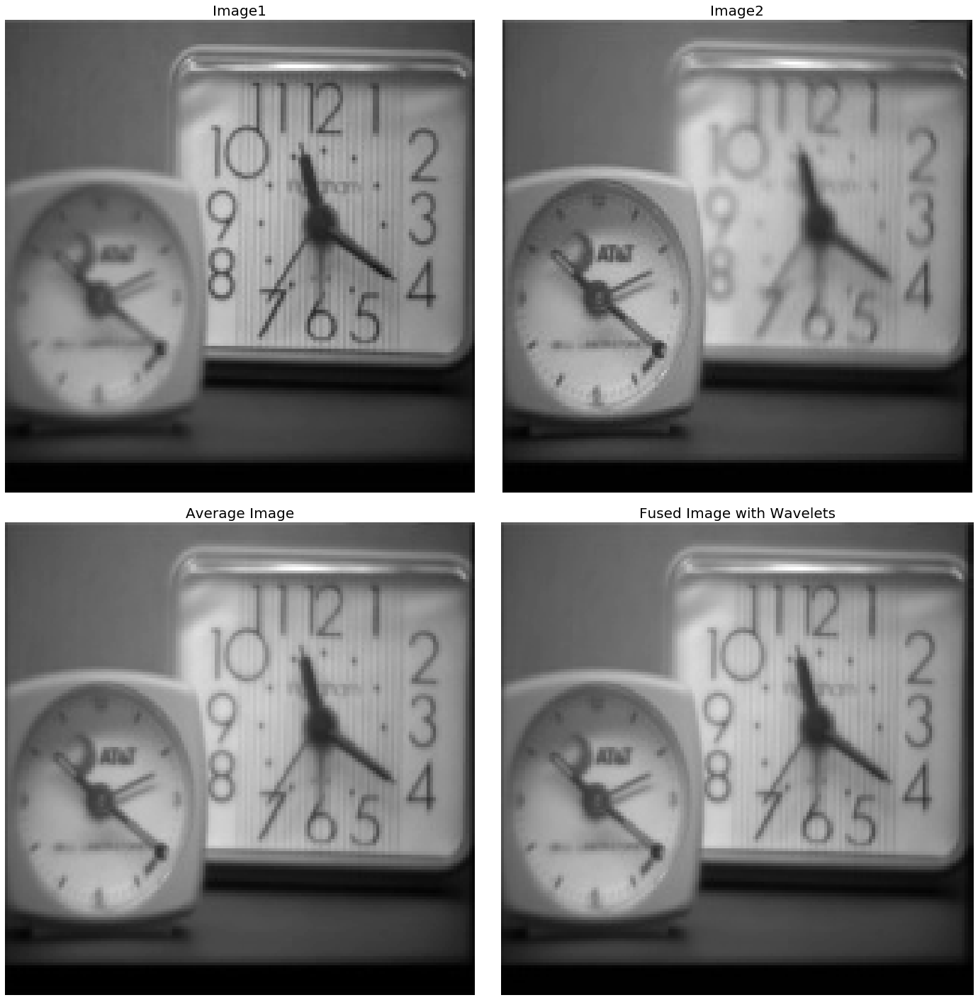

In [97]:
#print(fused_image.shape)
plt.figure(figsize=(20,20))
plt.subplot(221), plt.imshow(im1), plt.axis('off'), plt.title('Image1', size=20) #cv2.cvtColor(fused_image,cv2.COLOR_BGR2RGB))
plt.subplot(222), plt.imshow(im2), plt.axis('off'), plt.title('Image2', size=20) #cv2.cvtColor(fused_image,cv2.COLOR_BGR2RGB))
#print(np.max(im1), np.max(im2))
plt.subplot(223), plt.imshow(im1//2 + im2// 2), plt.axis('off'), plt.title('Average Image', size=20) #cv2.cvtColor(fused_image,cv2.COLOR_BGR2RGB))
# Fith: Show image
plt.subplot(224), plt.imshow(fused_image), plt.axis('off'), plt.title('Fused Image with Wavelets', size=20) #cv2.cvtColor(fused_image,cv2.COLOR_BGR2RGB))
plt.tight_layout()
plt.show()

## 7. Secure Spread Spectrum Digital Watermarking with DCT

In [98]:
from scipy.fftpack import dct, idct
from skimage.io import imread
from skimage.color import rgb2gray
import numpy as np
import matplotlib.pylab as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [99]:
def dct2(a):
    return dct(dct(a.T, norm='ortho').T, norm='ortho')

def idct2(a):
    return idct(idct(a.T, norm='ortho').T, norm='ortho')    

In [100]:
def embed(im, k, alpha):
    m, n = im.shape
    d = dct2(im)
    indices = np.dstack(np.unravel_index(np.argsort(d.ravel()), (m, n)))[0]
    indices = indices[-(k+1):-1]
    cw = d[indices[:,0], indices[:,1]]
    w = np.random.randn(k)
    #w = w / np.linalg.norm(w)
    ci = cw * (1 + alpha * w)
    d[indices[:,0], indices[:,1]] = ci
    im1 = idct2(d)
    return im1, indices, cw, w

In [101]:
def detect(test, indices, cw, w, alpha):
    d = dct2(test)
    testc = d[indices[:,0], indices[:,1]]
    what = (testc/cw - 1) / alpha
    gamma = what@w/(np.linalg.norm(what)) #*np.linalg.norm(w))
    return gamma

In [103]:
k = 1000
alpha = 0.1
im = rgb2gray(imread('images/Img_04_04.jpg'))
im = (255*im).astype(np.uint8)
im1, indices, cw, w = embed(im, k=k, alpha=alpha)
print('mean difference={}, max difference={}'.format(np.mean(np.abs(im1-im)), np.max(np.abs(im1-im))))
similarity = detect(im1, indices, cw, w, alpha)
print('detected similarity={}'.format(similarity))

mean difference=2.5592989049936357, max difference=11.63565345218143
detected similarity=30.682104140686345


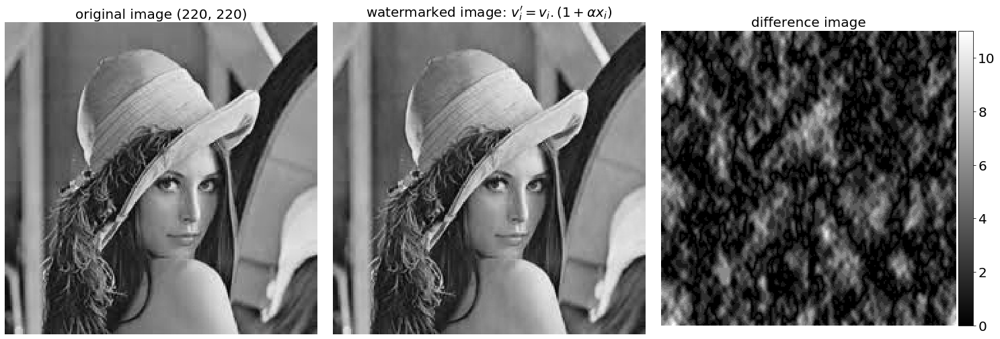

In [104]:
fig = plt.figure(figsize=(20,10))
plt.gray()
plt.subplots_adjust(0,0,1,0.925,0.05,0.05)
plt.subplot(131), plt.imshow(im), plt.axis('off'), plt.title('original image {}'.format(im.shape), size=20)
plt.subplot(132), plt.imshow(im1), plt.axis('off'), plt.title(r'watermarked image: $v_i^{\prime}=v_i.(1+\alpha x_i)$', size=20)
plt.subplot(133)
last_axes = plt.gca()
img = plt.imshow((np.abs(im1-im)).astype(np.uint8))
divider = make_axes_locatable(img.axes)
cax = divider.append_axes("right", size="5%", pad=0.05)
fig.colorbar(img, cax=cax)
plt.sca(last_axes)
plt.axis('off'), plt.title('difference image', size=20)
plt.show()

![](../images/ssw.gif)

### References:

1. https://youtu.be/aVTrlKHucJI
2. https://youtu.be/SS-8zvevw_c
3. https://youtu.be/nn1aFFIKq70